In [1]:
import os
import numpy as np
from PIL import Image, ImageOps, ImageEnhance
import random
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import torch.optim as optim
from torchsummary import summary
import matplotlib.pyplot as plt
from piq import MultiScaleSSIMLoss
from skimage.metrics import peak_signal_noise_ratio

# Seting the device for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [2]:
class HDRDataset(Dataset):
    def __init__(
        self,
        underexposed_dir: str,
        overexposed_dir: str,
        ground_truth_dir: str,
        indices: list = None,
        augment: bool = True
    ):
        # File lists
        self.underexposed_list  = sorted(os.listdir(underexposed_dir))
        self.overexposed_list   = sorted(os.listdir(overexposed_dir))
        self.ground_truth_list  = sorted(os.listdir(ground_truth_dir))
        
        if indices is not None:
            self.underexposed_list = [self.underexposed_list[i] for i in indices]
            self.overexposed_list  = [self.overexposed_list[i]  for i in indices]
            self.ground_truth_list = [self.ground_truth_list[i] for i in indices]

        self.underexposed_dir  = underexposed_dir
        self.overexposed_dir   = overexposed_dir
        self.ground_truth_dir  = ground_truth_dir

        # Helper in converting from sRGB to linear
        def srgb_to_linear(x: torch.Tensor) -> torch.Tensor:
            return torch.where( x <= 0.04045, x / 12.92, ((x + 0.055) / 1.055) ** 2.4 )

        # Normalization (ImageNet stats), also in linear RGB
        self.normalize = transforms.Compose([
            transforms.ToTensor(),                                 # [0,255]→[0,1] sRGB
            transforms.Lambda(lambda x: srgb_to_linear(x)),        # linearizing
            transforms.Normalize(
                mean=[0.485,0.456,0.406],
                std =[0.229,0.224,0.225])
        ])

    def __len__(self):
        return len(self.underexposed_list)

    def __getitem__(self, idx):

        underexposed_img = Image.open(os.path.join(self.underexposed_dir, self.underexposed_list[idx])).convert("RGB")
        overexposed_img = Image.open(os.path.join(self.overexposed_dir, self.overexposed_list[idx])).convert("RGB")
        ground_truth_img = Image.open(os.path.join(self.ground_truth_dir, self.ground_truth_list[idx])).convert("RGB")

        # Applying Transformations
        # 1) Random horizontal flip
        if random.random() < 0.5:
            underexposed_img, overexposed_img, ground_truth_img = \
                           TF.hflip(underexposed_img), TF.hflip(overexposed_img), TF.hflip(ground_truth_img)

        # 2) Random rotation
        angle = random.uniform(-15, 15)
        underexposed_img, overexposed_img, ground_truth_img = \
                          TF.rotate(underexposed_img, angle), TF.rotate(overexposed_img, angle), TF.rotate(ground_truth_img, angle)

        # 3) Random affine (Translation, Scaling and Shearing)
        translate = (
            int(random.uniform(-0.05, 0.05) * underexposed_img.size[0]),
            int(random.uniform(-0.05, 0.05) * underexposed_img.size[1]))
        
        scale = random.uniform(0.95, 1.05)
        
        shear = random.uniform(-5, 5)
        
        underexposed_img = TF.affine(underexposed_img, angle=0, translate=translate, scale=scale, shear=shear)
        overexposed_img = TF.affine(overexposed_img, angle=0, translate=translate, scale=scale, shear=shear)
        ground_truth_img = TF.affine(ground_truth_img, angle=0, translate=translate, scale=scale, shear=shear)

        # 4) Converting To Tensor + Normalization
        underexposed_img = self.normalize(underexposed_img)
        overexposed_img = self.normalize(overexposed_img)
        ground_truth_img = self.normalize(ground_truth_img)

        return underexposed_img, overexposed_img, ground_truth_img

In [3]:
# Folder paths
ground_truth_folder = "Dataset_HDR/Size 384 Images/Ground Truth Images_384"
underexposed_folder = "Dataset_HDR/Size 384 Images/UnderExposed Images_384"
overexposed_folder  = "Dataset_HDR/Size 384 Images/OverExposed Images_384"

In [4]:
# Getting list of indices and Train-Test Splits
all_indices = list(range(len(os.listdir(underexposed_folder))))
train_indices, test_indices = train_test_split(all_indices, test_size=0.1)

In [5]:
# Creating datasets with the new HDRDataset signature
train_dataset = HDRDataset(underexposed_dir = underexposed_folder, overexposed_dir = overexposed_folder,
                           ground_truth_dir = ground_truth_folder, indices = train_indices, augment = True)

test_dataset = HDRDataset(underexposed_dir = underexposed_folder, overexposed_dir = overexposed_folder,
                          ground_truth_dir = ground_truth_folder, indices = test_indices, augment = False)

BATCH_SIZE  = 8
NUM_WORKERS = 4
PIN_MEMORY  = True

train_loader = DataLoader(train_dataset, batch_size = BATCH_SIZE, shuffle = True, 
                          num_workers = NUM_WORKERS, pin_memory = PIN_MEMORY)

test_loader = DataLoader(test_dataset, batch_size = BATCH_SIZE, shuffle = True,
                         num_workers = NUM_WORKERS,pin_memory=PIN_MEMORY)

In [6]:
# Total number of images in each folder
total_underexposed = len(os.listdir(underexposed_folder))
total_overexposed  = len(os.listdir(overexposed_folder))

print(f"Total number of UnderExposed images: {total_underexposed}")
print(f"Total number of OverExposed images : {total_overexposed}\n")

print(f"Number of images in Train split of UnderExposed Folder: {len(train_dataset.underexposed_list)}")
print(f"Number of images in Test  split of UnderExposed Folder: {len(test_dataset.underexposed_list)}\n")

print(f"Number of images in Train split of OverExposed Folder: {len(train_dataset.overexposed_list)}")
print(f"Number of images in Test  split of OverExposed Folder: {len(test_dataset.overexposed_list)}")

Total number of UnderExposed images: 400
Total number of OverExposed images : 400

Number of images in Train split of UnderExposed Folder: 360
Number of images in Test  split of UnderExposed Folder: 40

Number of images in Train split of OverExposed Folder: 360
Number of images in Test  split of OverExposed Folder: 40


In [7]:
class HDRResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1, dropout_prob=0.3):
        super(HDRResidualBlock, self).__init__()
        
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=5, stride=stride, padding=2, bias=True)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.Leakyrelu = nn.LeakyReLU(0.1, inplace=True)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout2d(p=dropout_prob)

        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=5, stride=1, padding=2, bias=True)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.dropout2 = nn.Dropout2d(p=dropout_prob)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=True),
                nn.BatchNorm2d(out_channels)
            )
 
    def forward(self, x):
        identity = self.shortcut(x)
        identity = self.pool(identity)

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.Leakyrelu(out)
        out = self.pool(out)
        out = self.dropout1(out)

        out = self.conv2(out)
        out = self.bn2(out)
        
        out = out + identity
        out = self.Leakyrelu(out)
        out = self.dropout2(out)

        return out

In [8]:
class HDRBranchUNet(nn.Module):
    def __init__(self, dropout_prob=0.3):
        super().__init__()
        
        # Encoder
        self.initial_conv = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=5, padding=2, bias=True),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.1, inplace=True),
            nn.MaxPool2d(2, 2),              # → (B,32,192,192)
            nn.Dropout2d(dropout_prob)
        )
        self.downlayer1 = HDRResidualBlock( 32,  64, dropout_prob=dropout_prob)  # → (B,64,96,96)
        self.downlayer2 = HDRResidualBlock( 64, 128, dropout_prob=dropout_prob)  # → (B,128,48,48)
        self.downlayer3 = HDRResidualBlock(128, 256, dropout_prob=dropout_prob)  # → (B,256,24,24)
        self.downlayer4 = HDRResidualBlock(256, 512, dropout_prob=dropout_prob)  # → (B,512,12,12)
        self.downlayer5 = HDRResidualBlock(512,1024,dropout_prob=dropout_prob)   # → (B,1024,6,6)

        # Decoder (upsample)
        self.uplayer5 = nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1)             # → (B,512,12,12)
        self.skip_conn5 = nn.Sequential(nn.Conv2d(512+512, 512, kernel_size=3, padding=1, bias=True),
            nn.BatchNorm2d(512), nn.LeakyReLU(0.1, inplace=True))

        self.uplayer4 = nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1)              # → (B,256,24,24)
        self.skip_conn4 = nn.Sequential(nn.Conv2d(256+256, 256, kernel_size=3, padding=1, bias=True),
            nn.BatchNorm2d(256), nn.LeakyReLU(0.1, inplace=True))

        self.uplayer3 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)              # → (B,128,48,48)
        self.skip_conn3 = nn.Sequential(nn.Conv2d(128+128, 128, kernel_size=3, padding=1, bias=True),
            nn.BatchNorm2d(128), nn.LeakyReLU(0.1, inplace=True))

        self.uplayer2 = nn.ConvTranspose2d(128,  64, kernel_size=4, stride=2, padding=1)              # → (B,64,96,96)
        self.skip_conn2 = nn.Sequential(nn.Conv2d(64+64, 64, kernel_size=3, padding=1, bias=True),
            nn.BatchNorm2d(64), nn.LeakyReLU(0.1,inplace=True))

        self.uplayer1 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)               # → (B,32,192,192)
        self.skip_conn1 = nn.Sequential(nn.Conv2d(32+32, 32, kernel_size=3, padding=1, bias=True),
            nn.BatchNorm2d(32), nn.LeakyReLU(0.1,inplace=True))

        self.uplayer0 = nn.ConvTranspose2d(32, 32, kernel_size=4, stride=2, padding=1)              # → (B,32,384,384)
        self.final_conv = nn.Conv2d(32, 3, kernel_size=1)                                           # → (B,3,384,384)

    def forward(self, x):
        # --- Encoder ---
        e0 = self.initial_conv(x)       # 32×192
        e1 = self.downlayer1(e0)        # 64×96
        e2 = self.downlayer2(e1)        # 128×48
        e3 = self.downlayer3(e2)        # 256×24
        e4 = self.downlayer4(e3)        # 512×12
        e5 = self.downlayer5(e4)        # 1024×6

        # --- Decoder with skip connections ---
        d5 = self.uplayer5(e5)                                   # 512×12
        d5 = self.skip_conn5(torch.cat([d5, e4], dim=1))         # fuse with e4

        d4 = self.uplayer4(d5)                                   # 256×24
        d4 = self.skip_conn4(torch.cat([d4, e3], dim=1))         # fuse with e3

        d3 = self.uplayer3(d4)                                   # 128×48
        d3 = self.skip_conn3(torch.cat([d3, e2], dim=1))         # fuse with e2

        d2 = self.uplayer2(d3)                                   # 64×96
        d2 = self.skip_conn2(torch.cat([d2, e1], dim=1))         # fuse with e1

        d1 = self.uplayer1(d2)                                   # 32×192
        d1 = self.skip_conn1(torch.cat([d1, e0], dim=1))         # fuse with e0

        d0 = self.uplayer0(d1)                                   # 32×384
        
        return self.final_conv(d0)

In [9]:
class HDRConcat(nn.Module):
    def __init__(self, dropout_prob=0.3):
        super().__init__()
        
        # Two parallel UNet-style branches (each's outputs is a 3 channel 384×384 image)
        self.branch_underexposed = HDRBranchUNet(dropout_prob=dropout_prob)
        self.branch_overexposed  = HDRBranchUNet(dropout_prob=dropout_prob)

        # Merging and refining the concatenated HDR maps
        self.concat_conv = nn.Sequential(
            nn.Conv2d(6, 32, kernel_size=3, padding=1, bias=True),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(32, 16, kernel_size=3, padding=1, bias=True),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(16,  3, kernel_size=1))

    def forward(self, underexposed_img, overexposed_img):
        
        # Each branch which has full UNet skips internally
        hdr_underexposed = self.branch_underexposed(underexposed_img)     # → (B,3,384,384)
        hdr_overexposed = self.branch_overexposed(overexposed_img)        # → (B,3,384,384)

        # Concatenating and refining
        x = torch.cat([hdr_underexposed, hdr_overexposed], dim=1)         # → (B,6,384,384)
        
        return self.concat_conv(x)                                        # → (B,3,384,384)

In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = HDRConcat(dropout_prob=0.3).to(device)

# Printing the summary of the model
print("The Model Summary is:")
summary(model, [(3,  384, 384), (3,  384, 384)])

The Model Summary is:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 384, 384]           2,432
       BatchNorm2d-2         [-1, 32, 384, 384]              64
         LeakyReLU-3         [-1, 32, 384, 384]               0
         MaxPool2d-4         [-1, 32, 192, 192]               0
         Dropout2d-5         [-1, 32, 192, 192]               0
            Conv2d-6         [-1, 64, 192, 192]           2,112
       BatchNorm2d-7         [-1, 64, 192, 192]             128
         MaxPool2d-8           [-1, 64, 96, 96]               0
            Conv2d-9         [-1, 64, 192, 192]          51,264
      BatchNorm2d-10         [-1, 64, 192, 192]             128
        LeakyReLU-11         [-1, 64, 192, 192]               0
        MaxPool2d-12           [-1, 64, 96, 96]               0
        Dropout2d-13           [-1, 64, 96, 96]               0
           Conv2d

In [11]:
# Hyperparameters & Setup
BATCH_SIZE = 8
LR         = 1e-4
MAX_EPOCHS = 50
DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Denormalization
mean = torch.tensor([0.485,0.456,0.406], device=DEVICE)[None,:,None,None]
std  = torch.tensor([0.229,0.224,0.225], device=DEVICE)[None,:,None,None]

def denormalize(x):
    return x * std + mean

# Loss Functions
class HDRLoss(nn.Module):
    def __init__(self,
                 alpha,                                    # Mean Absolute Error on RGB Loss (RGB‐L1)
                 beta,                                     # Luminance‐L1 Loss (Lum-L1)
                 gamma,                                    # Multi-Scale Structural Similarity Index Measure Loss (MS-SSIM)
                 delta,                                    # Color Preservation Loss (Lab-Chroma penalty)
                 eps_hist, hist_bins, hist_sigma):         # Soft Histogram Matching Loss 
                 
        super().__init__()
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.delta = delta
        self.eps_hist = eps_hist
        self.hist_bins = hist_bins
        self.hist_sigma = hist_sigma

        self.ms_ssim_loss = MultiScaleSSIMLoss(data_range=1.0,reduction='mean')

    def get_luminance(self, img):
        R, G, B = img[:,0:1], img[:,1:2], img[:,2:3]
        return 0.2126*R + 0.7152*G + 0.0722*B

    def color_preservation_loss(self, pred, target):
        lum_p = self.get_luminance(pred)
        lum_t = self.get_luminance(target)
        return F.l1_loss(pred - lum_p, target - lum_t)

    def _soft_histogram(self, x):
        
        # x: B×3×H×W in [0,1]
        bins = self.hist_bins
        sigma = self.hist_sigma
        centers = torch.linspace(0.0, 1.0, bins, device=x.device)  # [bins]
        x_expanded = x.unsqueeze(-1)                               # B×3×H×W×1
        c = centers.view(1,1,1,1,bins)                             # 1×1×1×1×bins
        diff = x_expanded - c                                      # B×3×H×W×bins
        weights = torch.exp(-0.5 * (diff / sigma)**2)              # Gaussian
        hist = weights.sum(dim=[2,3])                              # B×3×bins
        hist = hist / (hist.sum(dim=-1, keepdim=True) + 1e-6)      # normalize
        return hist                                                # B×3×bins

    def histogram_loss(self, pred, target):
        Hp = self._soft_histogram(pred)
        Ht = self._soft_histogram(target)
        return F.l1_loss(Hp, Ht)

    def forward(self, pred, target):
        rgb_l1_loss = F.l1_loss(pred, target)
        lum_l1_loss = F.l1_loss(self.get_luminance(pred), self.get_luminance(target))
        ms_ssim_loss = self.ms_ssim_loss(pred, target)
        color_pre_l1_loss = self.color_preservation_loss(pred, target)
        hist_loss = self.histogram_loss(pred, target)

        return (self.alpha * rgb_l1_loss + self.beta * lum_l1_loss + self.gamma * ms_ssim_loss + self.delta * color_pre_l1_loss +
            self.eps_hist * hist_loss)

loss_fn = HDRLoss( alpha = 0.8, beta = 0.6, gamma = 0.3, delta = 2.0, eps_hist = 0.1, hist_bins = 32, hist_sigma = 0.01).to(DEVICE)


# Model and Optimizer
model     = HDRConcat(dropout_prob=0.3).to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=LR)
scaler    = torch.amp.GradScaler()

# Training + Testing Loops
train_losses, test_losses = [], []
print("********** Training and Testing for Each Epochs wrt. Losses **********\n")

for epoch in range(1, MAX_EPOCHS+1):
    
    # Training
    model.train()
    total_train_loss = 0.0
    for u, o, gt in train_loader:
        u, o, gt = u.to(DEVICE), o.to(DEVICE), gt.to(DEVICE)
        optimizer.zero_grad()
        with torch.amp.autocast(device_type='cuda'):
            pred = model(u, o)
            p, g = denormalize(pred).clamp(0,1), denormalize(gt).clamp(0,1)
            loss = loss_fn(p, g)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        total_train_loss += loss.item()

    avg_train = total_train_loss / len(train_loader)
    train_losses.append(avg_train)

    # Testing
    model.eval()
    total_test_loss = 0.0
    with torch.no_grad():
        for u, o, gt in test_loader:
            u, o, gt = u.to(DEVICE), o.to(DEVICE), gt.to(DEVICE)
            pred = model(u, o)
            p, g = denormalize(pred).clamp(0,1), denormalize(gt).clamp(0,1)
            total_test_loss += loss_fn(p, g).item()

    avg_test = total_test_loss / len(test_loader)
    test_losses.append(avg_test)

    print(f"Epochs [{epoch}/{MAX_EPOCHS}]    "
          f"Training Loss: {avg_train:.4f}    |    Testing Loss: {avg_test:.4f}")

# Saving the final model
print("\nTraining & Testing completed. Saving final model weights…")
torch.save(model.state_dict(), "HDRModel.pth")
print("Model weights are saved to HDRModel.pth")

********** Training and Testing for Each Epochs wrt. Losses **********

Epochs [1/50]    Training Loss: 0.7261    |    Testing Loss: 0.5983
Epochs [2/50]    Training Loss: 0.5816    |    Testing Loss: 0.5327
Epochs [3/50]    Training Loss: 0.5282    |    Testing Loss: 0.4798
Epochs [4/50]    Training Loss: 0.4953    |    Testing Loss: 0.4542
Epochs [5/50]    Training Loss: 0.4678    |    Testing Loss: 0.4126
Epochs [6/50]    Training Loss: 0.4455    |    Testing Loss: 0.4076
Epochs [7/50]    Training Loss: 0.4243    |    Testing Loss: 0.4010
Epochs [8/50]    Training Loss: 0.4058    |    Testing Loss: 0.3985
Epochs [9/50]    Training Loss: 0.3890    |    Testing Loss: 0.3534
Epochs [10/50]    Training Loss: 0.3696    |    Testing Loss: 0.3442
Epochs [11/50]    Training Loss: 0.3550    |    Testing Loss: 0.3257
Epochs [12/50]    Training Loss: 0.3397    |    Testing Loss: 0.3106
Epochs [13/50]    Training Loss: 0.3255    |    Testing Loss: 0.2870
Epochs [14/50]    Training Loss: 0.3074 

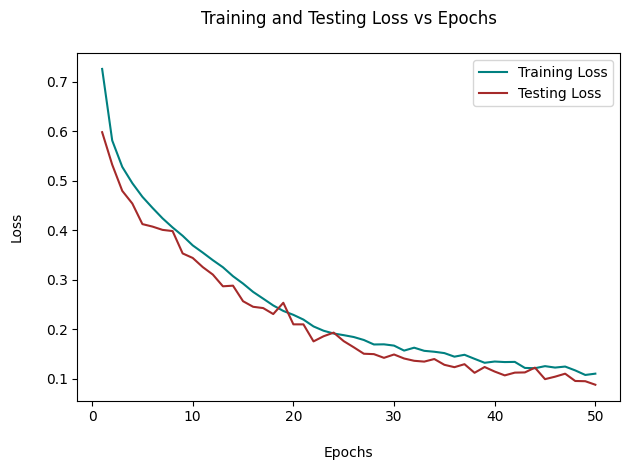

In [12]:
# Plotting Training and Testing Loss vs Epochs
epochs = range(1, len(train_losses) + 1)

plt.figure()
plt.plot(epochs, train_losses, label='Training Loss', color='teal')
plt.plot(epochs, test_losses,  label='Testing Loss', color='brown')
plt.xlabel('\nEpochs')
plt.ylabel('Loss\n')
plt.title('Training and Testing Loss vs Epochs\n')
plt.legend()
plt.tight_layout()
plt.show()


Press Enter to Display Next Test Image; Type 'quit' + Enter to Quit.


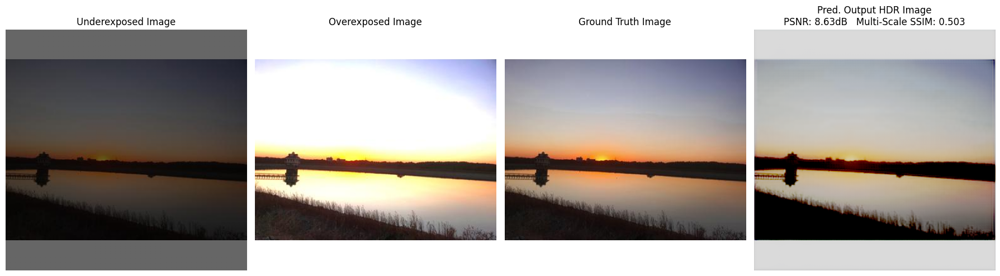

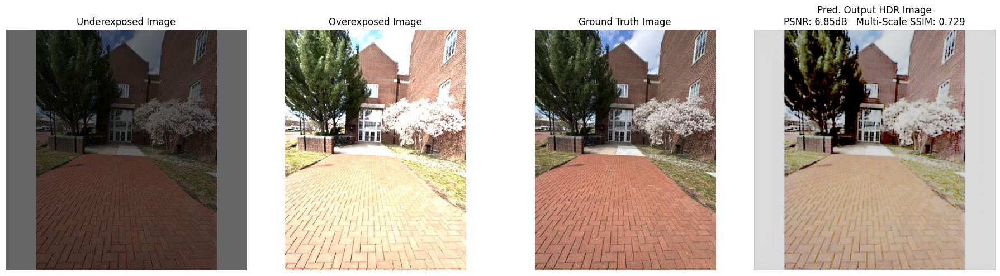

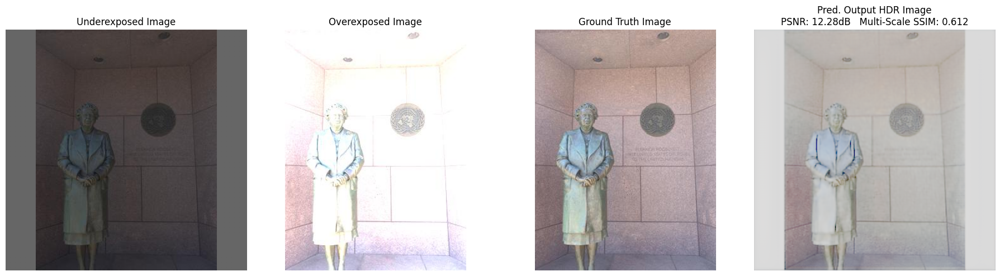

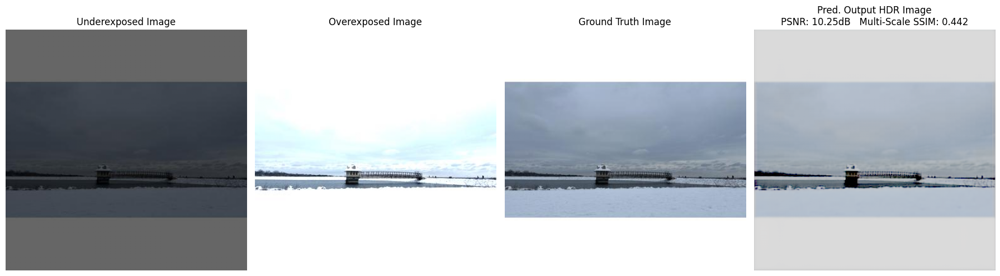

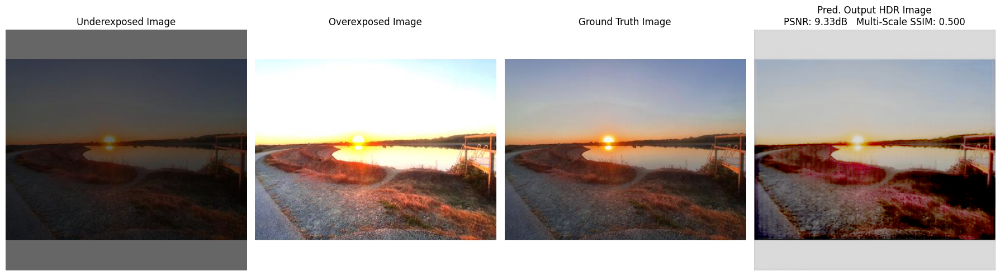

...

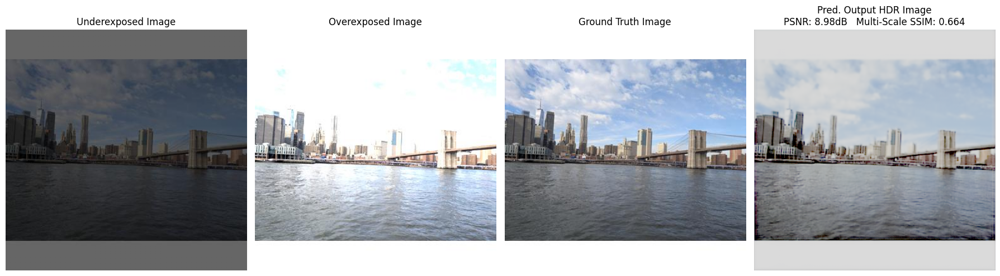

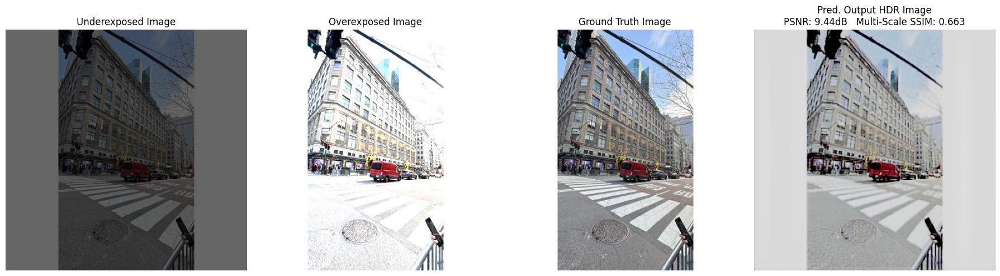

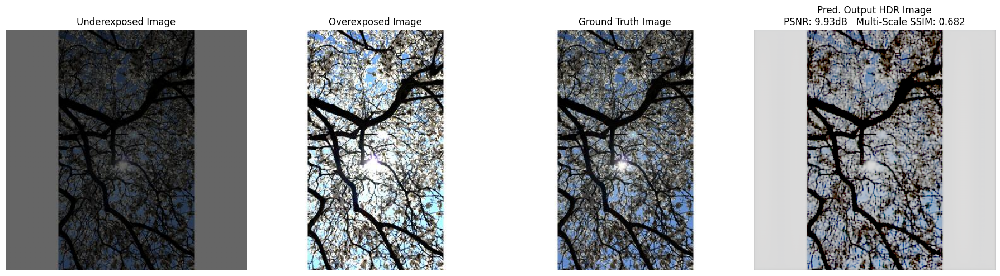

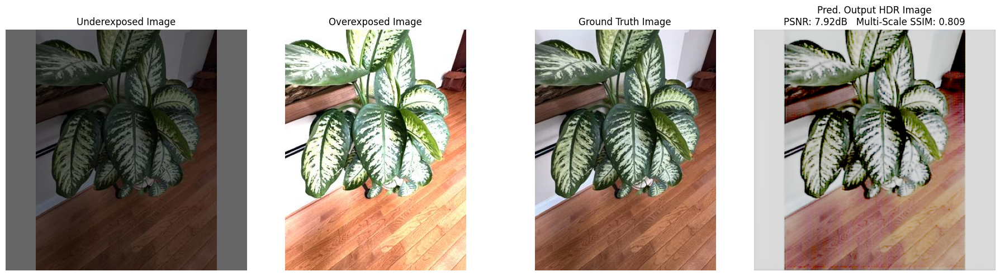

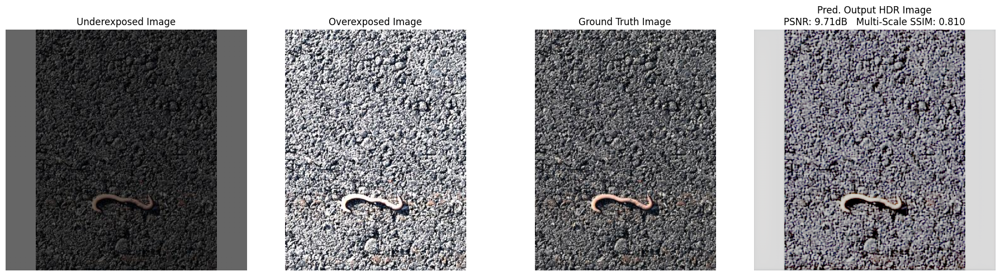

 quit


In [13]:
# Displaying of Output
display_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)

ms_ssim_metric = MultiScaleSSIMLoss(data_range=1.0, reduction='mean').to(DEVICE)

def linear_to_srgb(x: torch.Tensor) -> torch.Tensor:
    return torch.where(x <= 0.0031308, 12.92 * x, 1.055 * (x ** (1/2.4)) - 0.055)

print("\nPress Enter to Display Next Test Image; Type 'quit' + Enter to Quit.")
model.eval()
with torch.no_grad():
    for idx, (underexposed_t, overexposed_t, ground_truth_t) in enumerate(display_loader):
        
        # Loading images & normalizing
        f_underexposed_img, f_overexposed_img, f_ground_truth_img = (lst[idx] for lst in
            (test_dataset.underexposed_list, test_dataset.overexposed_list, test_dataset.ground_truth_list))
        
        underexposed_img = Image.open(os.path.join(underexposed_folder, f_underexposed_img)).convert("RGB")
        overexposed_img = Image.open(os.path.join(overexposed_folder,  f_overexposed_img)).convert("RGB")
        ground_truth_img = Image.open(os.path.join(ground_truth_folder, f_ground_truth_img)).convert("RGB")

        underexposed_in = test_dataset.normalize(underexposed_img).unsqueeze(0).to(DEVICE)
        overexposed_in = test_dataset.normalize(overexposed_img).unsqueeze(0).to(DEVICE)

        # Predicting and geting full-range linear radiance
        P_out = model(underexposed_in, overexposed_in)
        
        P_lin = denormalize(P_out)[0]
        ground_truth_lin = denormalize(ground_truth_t.to(DEVICE))[0].clamp(0,1)

        # Applying small fixed per channel gain
        exps = torch.tensor([2.5, 2.5, 2.5], device=P_lin.device).view(3,1,1)
        P_gain = P_lin * exps

        # Reinhard Tone Mapping
        P_tone = P_gain / (P_gain + 1.0)

        # Gamma correction to sRGB
        P_srgb = linear_to_srgb(P_tone.clamp(0,1))
        P_np   = P_srgb.permute(1,2,0).cpu().numpy()

        # Prep reference images
        underexposed_np = np.array(underexposed_img)/255.0
        overexposed_np = np.array(overexposed_img)/255.0
        ground_truth_np = np.array(ground_truth_img)/255.0

        # Metrics on linear domain
        P_metric = denormalize(P_out).clamp(0,1)
        ground_truth_metric = denormalize(ground_truth_t.to(DEVICE)).clamp(0,1)
        P_arr = P_metric[0].permute(1,2,0).cpu().numpy()
        ground_truth_arr = ground_truth_metric[0].permute(1,2,0).cpu().numpy()

        psnr_val = peak_signal_noise_ratio(ground_truth_arr, P_arr, data_range=1.0)
        
        ms_ssim_val = ms_ssim_metric(P_metric, ground_truth_metric).item()

        # Plotting of Images
        fig, axs = plt.subplots(1,4,figsize=(18,5))
        axs[0].imshow(underexposed_np); axs[0].set_title("Underexposed Image");    axs[0].axis('off')
        axs[1].imshow(overexposed_np); axs[1].set_title("Overexposed Image");     axs[1].axis('off')
        axs[2].imshow(ground_truth_np); axs[2].set_title("Ground Truth Image");    axs[2].axis('off')
        axs[3].imshow(P_np)
        axs[3].set_title(f"Pred. Output HDR Image\nPSNR: {psnr_val:.2f}dB   Multi-Scale SSIM: {ms_ssim_val:.3f}")
        axs[3].axis('off')

        plt.tight_layout()
        plt.show()

        if input().strip().lower().startswith('quit'):
            break

In [14]:
# END

In [15]:
!jupyter nbconvert --to html HDR_Project.ipynb

[NbConvertApp] Converting notebook HDR_Project.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 16 image(s).
[NbConvertApp] Writing 16127926 bytes to HDR_Project.html
